In [109]:
# Common useful packages
import matplotlib.pyplot as plt
from IPython.display import Image, display
from matplotlib import colors
from PIL import Image
import sys
from PyQt5.QtWidgets import QApplication
import numpy as np
import copy
import spectral
import pickle
import pandas as pd
import os
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from hsiViewer import hsi_viewer_ROI as hvr
import util_scripts as util
# Common useful packages
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.patches as mpatches
from sklearn.decomposition import PCA
import importlib
import numpy as np
import copy
import spectral
import pickle
import os

# local imports
import hyperspectral_gta_data as hsi_data
from hsiViewer import hsi_viewer_layers as hvl
from hsiViewer import hsi_viewer_ROI as hvr
from hsiViewer import hsi_viewer as hsv
import microscene_functions as msf



# module that is useful for reloading packages
import importlib

# Scripts associated with the SML4SI textbook
import hyperspectral_gta_data as hsi_data
import scripts_M2 as sm2

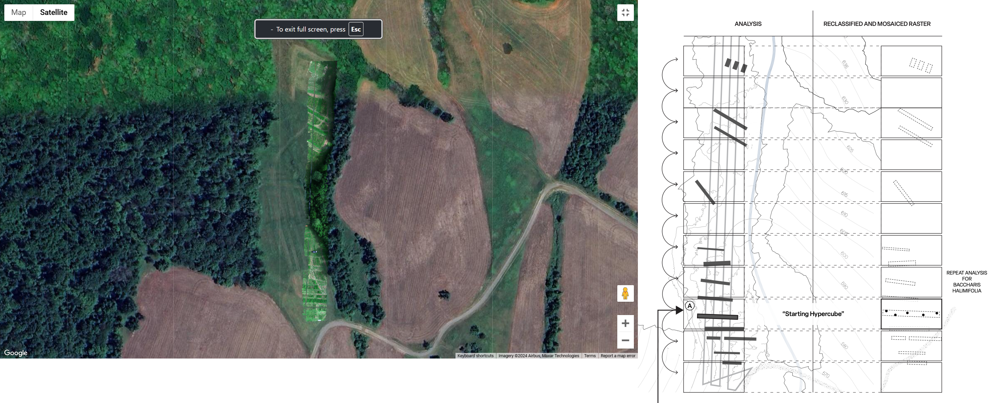

In [11]:
img = Image.open("combined_image.png")
img

<br>

---
<br>

# UPWINS 2025 - Morven Farms Data Analysis Workflow 
Last Updated: *March 4, 2025*
#### 1. Set up the directory containing all relevant file types
#### 2. Open the image and read it into an array
#### 3. Load the image into memory
#### 4. Confirm that the image has been successfully loaded
#### 5. Extract Regions of Interest (ROIs) from the image 
#### 6. Load Spectral Library
#### 7. Resample Spectral Library
#### 8. Perform models and classification algorithms
#### 9. Visualize results
#### 10. Document findings in a report and store it in the SDS folder on SharePoint

<br>

---

<br>

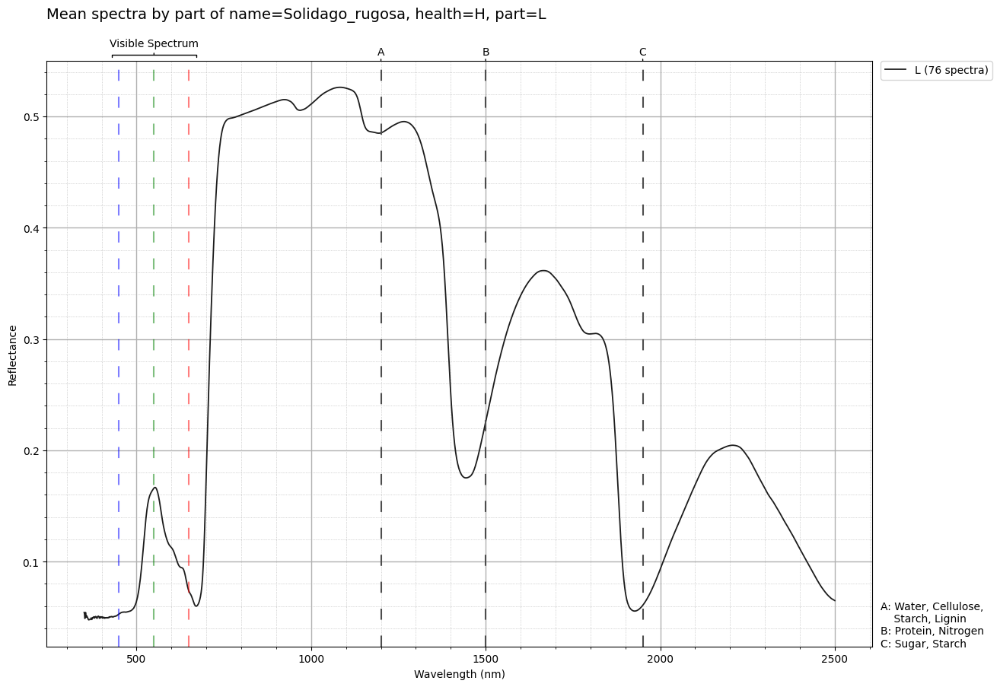

## Step One: Set up the directory containing all relevant file types

In [3]:
dir = '/Volumes/UPWINS_gia/Ortho_Rec'
fname_hdr = f'{dir}/raw_5000_or_quac.hdr'

## Step Two: Open the image and read it into an array

In [4]:
# Open the image and read into an array
im = spectral.envi.open(fname_hdr)
wl_im = np.asarray(im.bands.centers)

## Step Three: Load the image into memory

In [5]:
# Load the image into memory
im.Arr = im.load()
imArr = im.Arr
print(f'Shape of ImArr = {imArr.shape}')
im.List = np.reshape(imArr, (im.nrows*im.ncols, im.nbands))
print(f'Shape of imList = {im.List.shape}')

Shape of ImArr = (1324, 1206, 343)
Shape of imList = (1596744, 343)


In [7]:
# Create a mask for non-zero values across bands
mask = np.sum(im.Arr, axis=2) > 0
im.ListMask = np.reshape(mask, (im.nrows * im.ncols))
im.dataList = im.List[im.ListMask == 1, :]

print(f'Shape of dataList = {im.dataList.shape}')
dataList= im.dataList

Shape of dataList = (871566, 343)


## Step Four: Confirm that the image has been successfully loaded

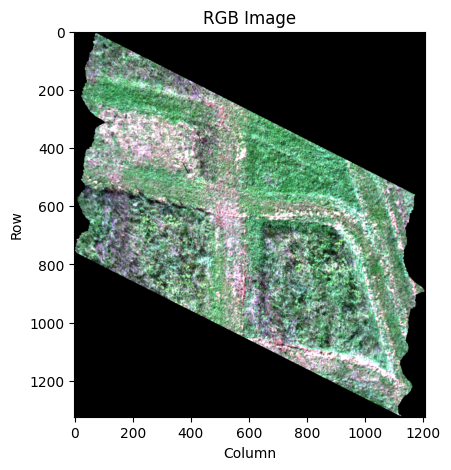

In [18]:
# display the image
sm2.display_RGB(imArr, wl_im, rotate=False)
plt.title('RGB Image');

## Step Five: Extract Regions of Interest (ROIs) from the image

In [9]:
from hsiViewer import hsi_viewer_ROI as hvr
importlib.reload(hvr)
hvr.viewer(im, stretch=[2,98], rotate=True)

KeyboardInterrupt: 

In [19]:
import pickle
fname = f'{dir}/MORVEN_soli_rugo.pkl'
with open(fname, 'rb') as f:
    roiData = pickle.load(f)

In [20]:
roiData.df

,Name,Color,Pixel_x,Pixel_y,399.096008,400.854004,402.612,404.369995,406.127991,407.885986,...,984.531006,986.289001,988.047974,989.80603,991.564026,993.322021,995.080017,996.838013,998.596008,1000.349976
0,soli_rug,#a700ea,309,108,830.0,735.0,635.0,885.0,561.0,681.0,...,2142.0,1989.0,2284.0,2249.0,1921.0,1668.0,1701.0,2008.0,1695.0,1516.0
1,soli_rug,#a700ea,310,108,765.0,680.0,519.0,731.0,688.0,528.0,...,1761.0,2238.0,2128.0,2195.0,1537.0,2113.0,1874.0,1643.0,2009.0,1978.0
2,soli_rug,#a700ea,311,108,700.0,828.0,915.0,608.0,730.0,758.0,...,1285.0,2387.0,2180.0,2142.0,1537.0,2113.0,2336.0,2252.0,1507.0,1978.0
3,soli_rug,#a700ea,312,108,1131.0,866.0,981.0,1069.0,842.0,1152.0,...,3332.0,2735.0,3270.0,2249.0,2744.0,2447.0,2740.0,2678.0,2511.0,2769.0
4,soli_rug,#a700ea,313,108,980.0,828.0,932.0,900.0,940.0,898.0,...,2856.0,2983.0,2803.0,2249.0,2525.0,2391.0,2394.0,2617.0,2448.0,2373.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611,surr_soli,#ff7f0e,325,247,1282.0,1164.0,1146.0,1069.0,1038.0,1076.0,...,3046.0,2834.0,2544.0,3106.0,2964.0,3003.0,3028.0,3225.0,3139.0,3098.0
612,surr_soli,#ff7f0e,326,247,1196.0,1126.0,998.0,1192.0,982.0,1165.0,...,3427.0,3033.0,1765.0,1981.0,2744.0,3170.0,3259.0,3590.0,3202.0,3625.0
613,surr_soli,#ff7f0e,327,247,1110.0,1126.0,1129.0,1192.0,1137.0,1216.0,...,3950.0,2785.0,2699.0,2249.0,2635.0,3114.0,3259.0,2738.0,2637.0,3691.0
614,surr_soli,#ff7f0e,328,247,1217.0,642.0,866.0,1023.0,1277.0,770.0,...,3189.0,2586.0,3167.0,2891.0,3952.0,3114.0,3028.0,3164.0,2699.0,3230.0


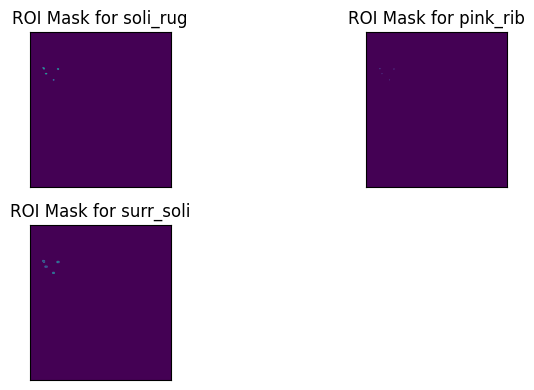

In [118]:
# determine how many rows of images (assuming each row has 2 masks)
nRowsPlots = int(np.ceil(nClasses/2)) # (change size of figure as needed)
plt.figure(figsize=(8, nRowsPlots*2))
for i in range(nClasses):
    name = roi_names[i]
    # create the subplot
    plt.subplot(nRowsPlots, 2, i+1)    
    plt.imshow(roi_masks[name])
    plt.xticks([])
    plt.yticks([])
    plt.title(f'ROI Mask for {name}');
    plt.tight_layout()

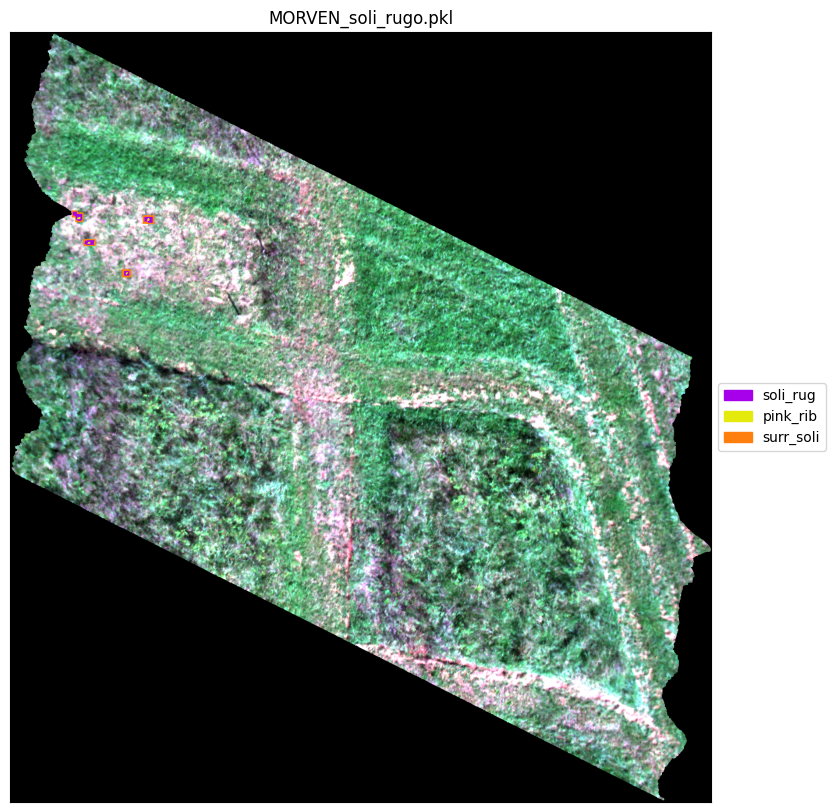

In [119]:
# Examine the locations
# create an RGB image
RGB_image_with_ROIs = msf.make_rgb(im.Arr, wl_im, stretch = [2,98])
# Add the ROI locations
for name in roi_names:
    # get the color for this ROI, converted from hex to (r,g,b)
    color = colors.to_rgb(roi_colors[name])
    mask = roi_masks[name]
    # set the pixel values for this ROI to (0,0,0)
    for i in range(3):
        RGB_image_with_ROIs[:,:,i] = RGB_image_with_ROIs[:,:,i]*(mask==False)
    # set the pixel values for this ROI to the color for this ROI
    for i in range(3):
        RGB_image_with_ROIs[:,:,i] = RGB_image_with_ROIs[:,:,i] + mask*color[i]

# Plot the image
plt.figure(figsize=(10,10))
plt.imshow(RGB_image_with_ROIs)
plt.xticks([])
plt.yticks([])
plt.title(os.path.basename(fname));
# Create legend patches: each patch is a colored box with the ROI name.
legend_patches = [mpatches.Patch(color=roi_colors[name], label=name) for name in roi_names]
# Add the legend to the right of the image
plt.legend(handles=legend_patches, loc='center left', bbox_to_anchor=(1, 0.5))


In [75]:
import microscene_functions as msf

df = roiData.df # a DataFrame holding all the data for the ROIs
roi_names = roiData.names # the names of the ROIs
roi_colors = roiData.colors # a Python dictionary of colors, where colors[class_name] will provide the color for class class_name
roi_masks = roiData.masks # a Python dictionary of location masks, where colors[class_name] will provide the numpy array for the mask
nClasses = len(roi_names)

# Examine the locations
# create an RGB image
RGB_image_with_ROIs = msf.make_rgb(im.Arr, wl_im, stretch = [2,98])
# Add the ROI locations
for name in roi_names:
    # get the color for this ROI, converted from hex to (r,g,b)
    color = colors.to_rgb(roi_colors[name])
    mask = roi_masks[name]
    # set the pixel values for this ROI to (0,0,0)
    for i in range(3):
        RGB_image_with_ROIs[:,:,i] = RGB_image_with_ROIs[:,:,i]*(mask==False)
    # set the pixel values for this ROI to the color for this ROI
    for i in range(3):
        RGB_image_with_ROIs[:,:,i] = RGB_image_with_ROIs[:,:,i] + mask*color[i]


In [77]:
spectra = df.to_numpy()[:,4:] # an array that holds all the spectra (each row is a spectrum)
spectra = spectra.astype(np.float32)
spectra_names = df['Name'].to_numpy()

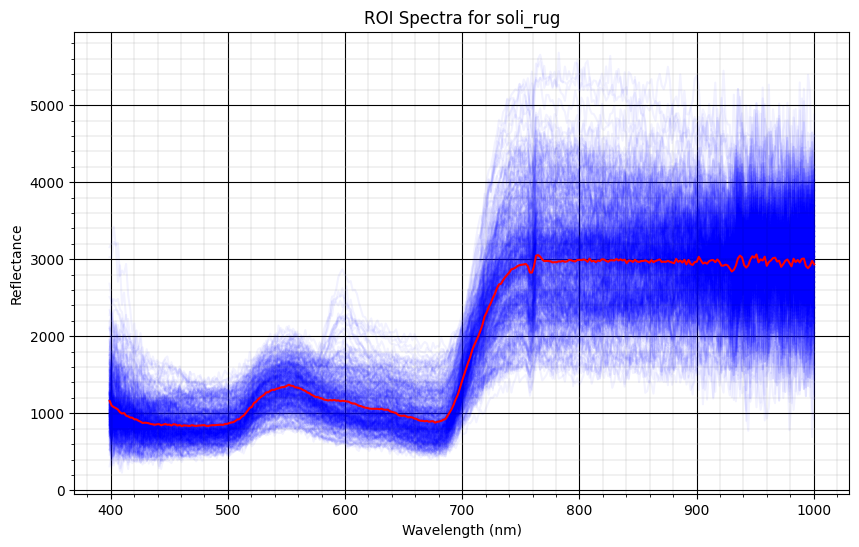

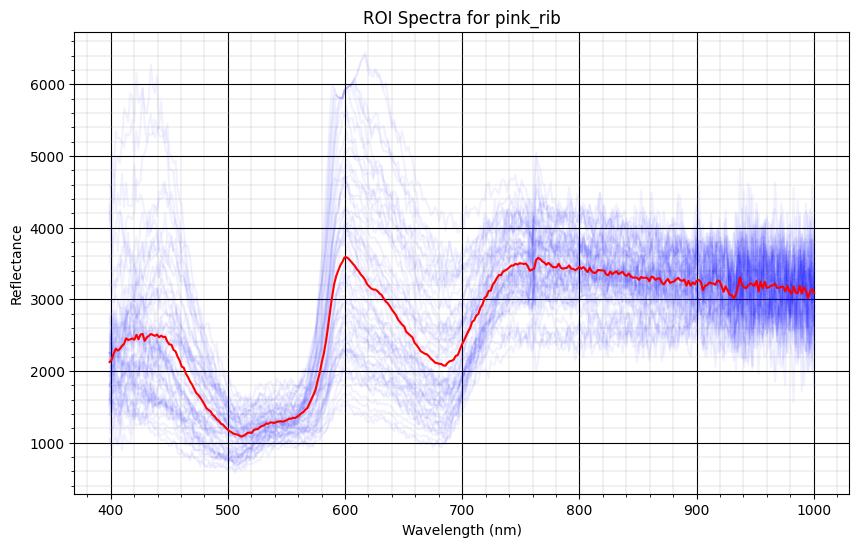

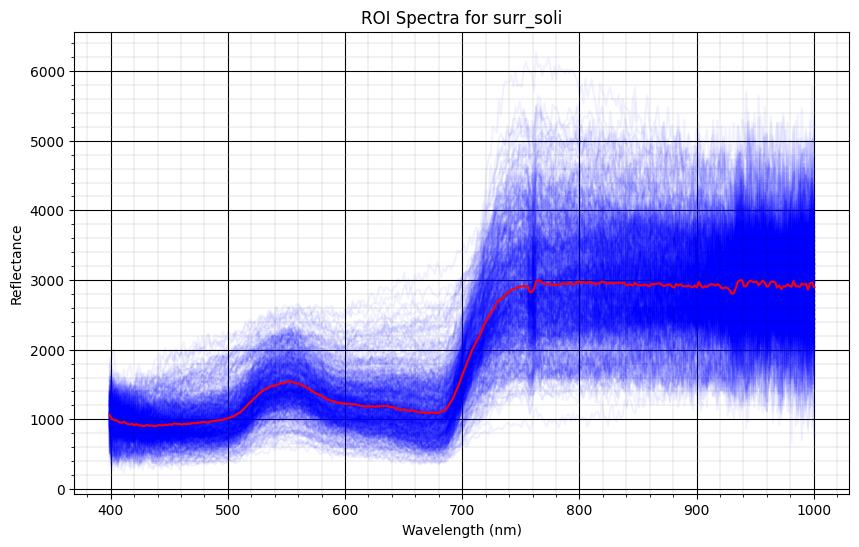

In [79]:
# plot the mean (red) and all individual spectra (blue) of each class
# we save the mean for each class for use later
means = {}
for name in roi_names:
    class_spectra = spectra[spectra_names==name,:]
    class_nSpec = class_spectra.shape[0]
    plt.figure(figsize=(10,6)) 
    for i in range(class_nSpec):
        plt.plot(wl_im,class_spectra[i,:].flatten(), color='b', alpha=0.05)
    means[name] = np.mean(class_spectra, axis=0)
    plt.plot(wl_im, means[name], color='r')
    plt.minorticks_on()
    plt.grid(True, which='major', c='k')
    plt.grid(True, which='minor', linewidth=0.25)
    plt.title(f'ROI Spectra for {name}')
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.grid(True)

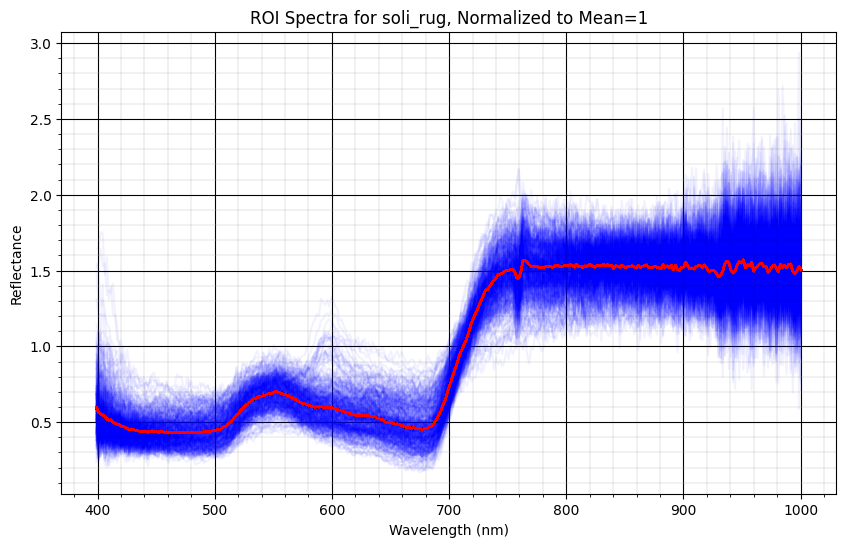

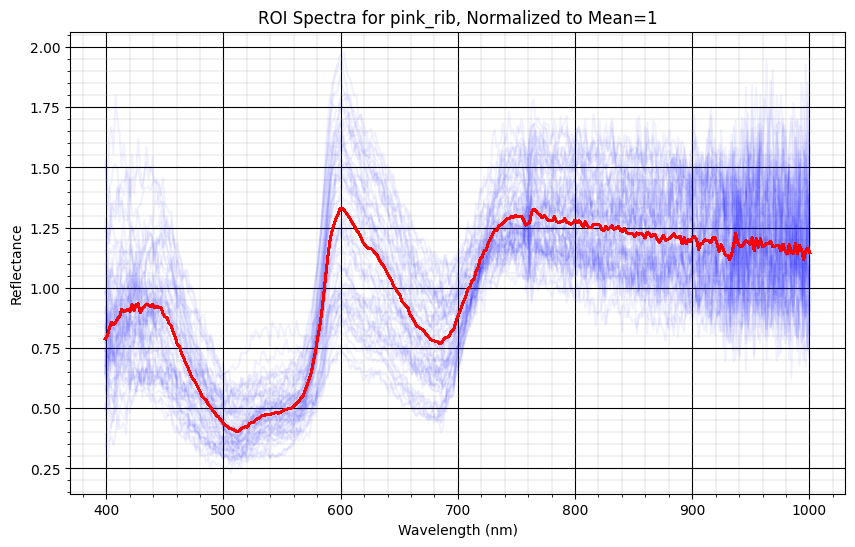

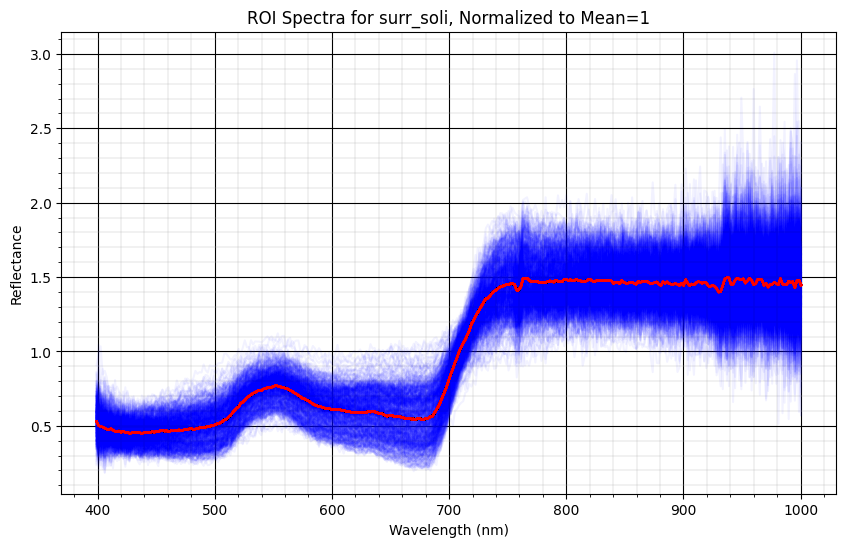

In [89]:
# plot the mean (red) and all individual spectra (blue) of each class, scaling all spectra to have mean value of 1
for name in roi_names:
    class_spectra = spectra[spectra_names==name,:]
    class_nSpec = class_spectra.shape[0]
    plt.figure(figsize=(10,6)) 
    for i in range(class_nSpec):
        plt.plot(wl_im,class_spectra[i,:].flatten()/np.mean(class_spectra[i,:].flatten()), color='b', alpha=0.05)
        plt.plot(wl_im, means[name]/np.mean(means[name]), color='r')

        plt.minorticks_on()
        plt.grid(True, which='major', c='k')
        plt.grid(True, which='minor', linewidth=0.25)
        plt.title(f'ROI Spectra for {name}, Normalized to Mean=1')
        plt.xlabel('Wavelength (nm)')
        plt.ylabel('Reflectance')
        plt.grid(True)

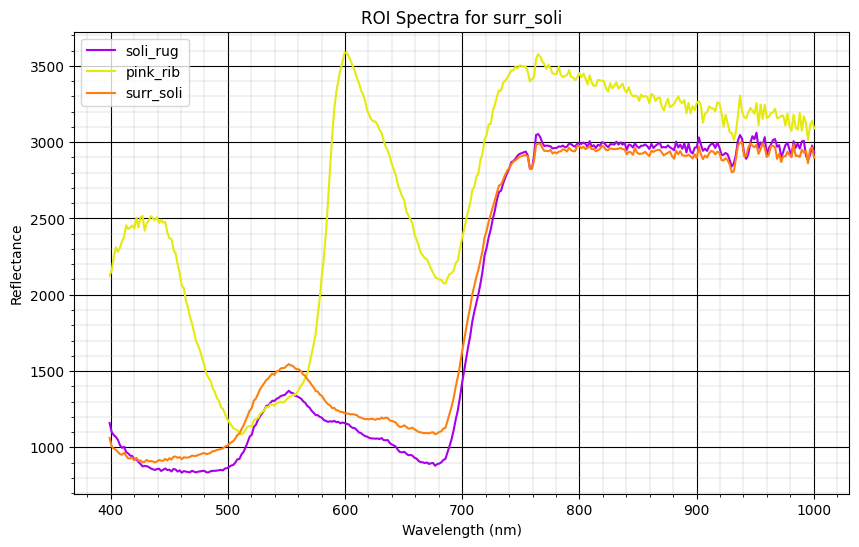

In [91]:
# plot all the means together
plt.figure(figsize=(10,6)) 
for name in roi_names:
    plt.plot(wl_im, means[name], label=name, color=roi_colors[name])
plt.minorticks_on()
plt.grid(True, which='major', c='k')
plt.grid(True, which='minor', linewidth=0.25)
plt.title(f'ROI Spectra for {name}')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.legend()
plt.grid(True)

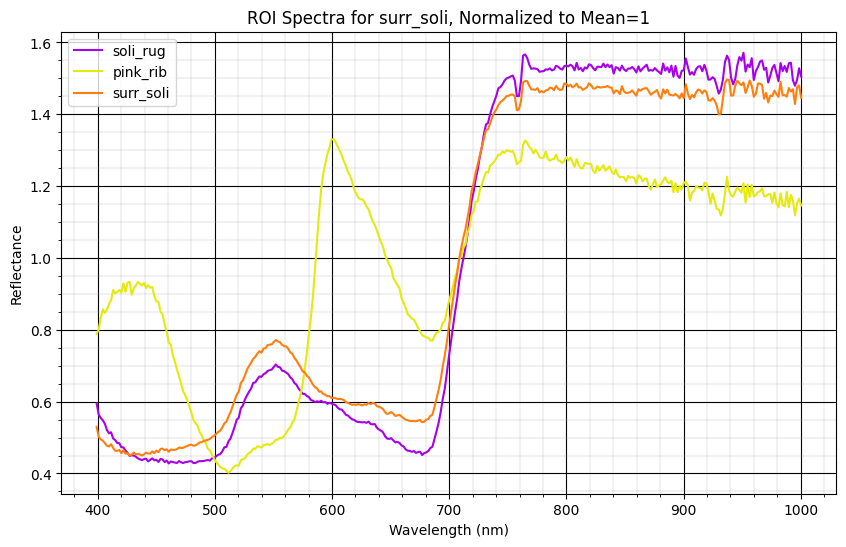

In [93]:
# plot all the means together
plt.figure(figsize=(10,6)) 
for name in roi_names:
    plt.plot(wl_im, means[name]/np.mean(means[name]), label=name, color=roi_colors[name])
plt.title(f'ROI Spectra for {name}, Normalized to Mean=1')
plt.minorticks_on()
plt.grid(True, which='major', c='k')
plt.grid(True, which='minor', linewidth=0.25)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.legend()
plt.grid(True)

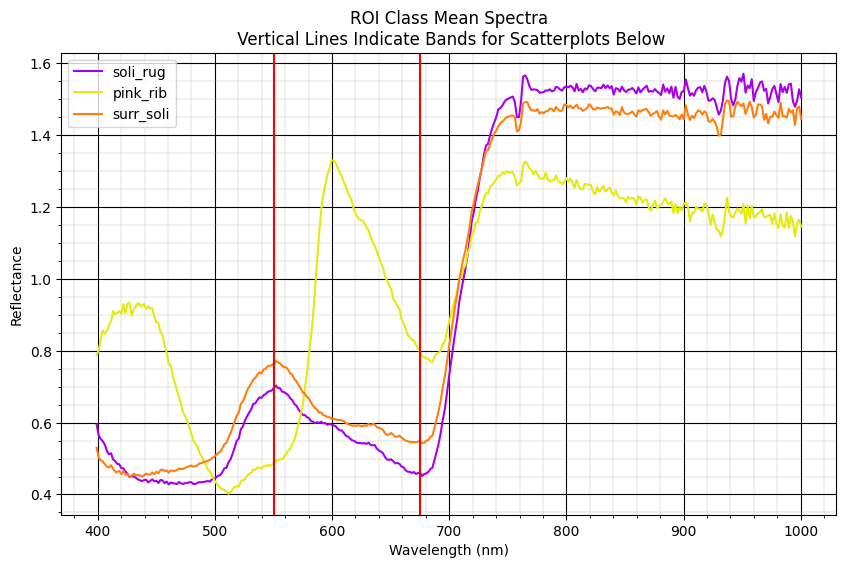

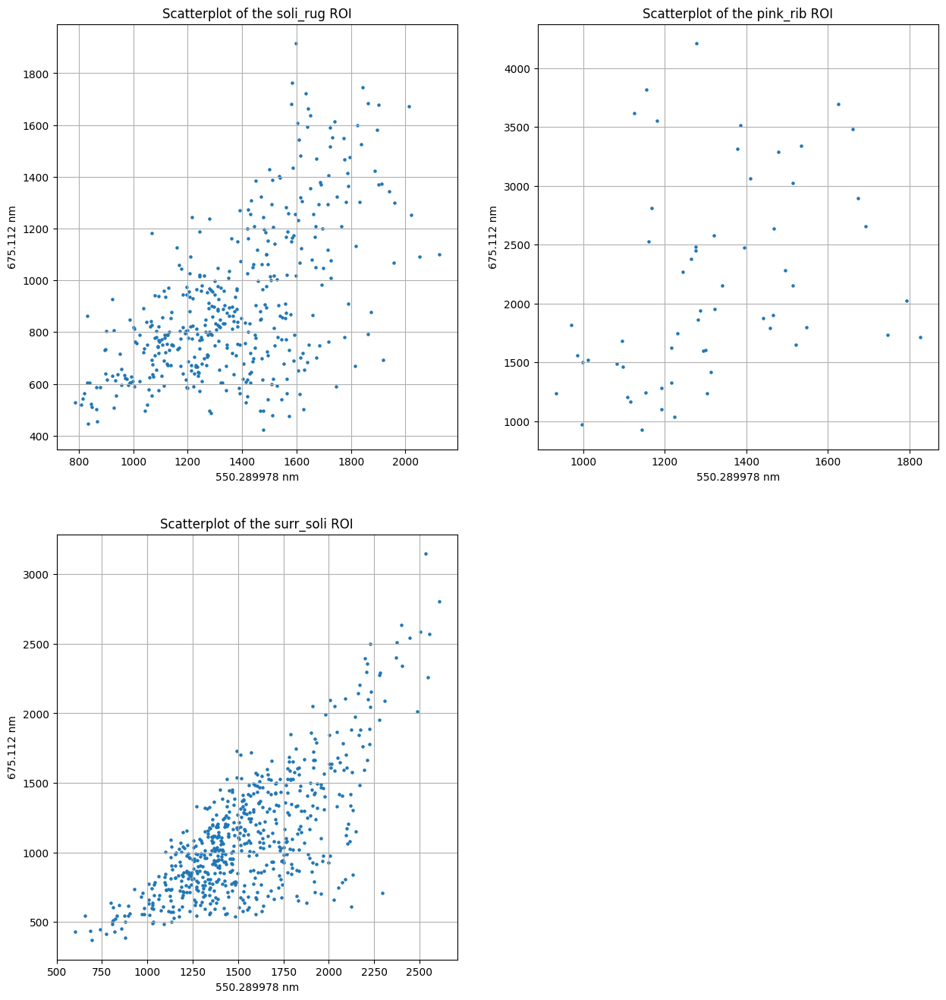

In [95]:
# Plot the class Means, then a scatterplot of each class on the same 2 bands
b1 = np.argmin(np.abs(wl_im-550))# index for band 1 for scatterplots
b2 = np.argmin(np.abs(wl_im-675))# index for band 2 for scatterplots

plt.figure(figsize=(10,6)) 
for name in roi_names:
    plt.plot(wl_im, means[name]/np.mean(means[name]), label=name, color=roi_colors[name])
plt.axvline(wl_im[b1], color='red')
plt.axvline(wl_im[b2], color='red')
plt.minorticks_on()
plt.grid(True, which='major', c='k')
plt.grid(True, which='minor', linewidth=0.25)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.legend()
plt.title(f'ROI Class Mean Spectra\n Vertical Lines Indicate Bands for Scatterplots Below')
plt.legend()
plt.grid(True)

nPlotRows = int(np.ceil(len(roi_names)/2))
plt.figure(figsize=(15,int(8*nPlotRows)))
i = 0
for name in roi_names:
    plt.subplot(nPlotRows, 2, i+1)  
    plt.title(f'Scatterplot of the {name} ROI')
    class_spectra = spectra[spectra_names==name,:]
    plt.scatter(class_spectra[:,b1], class_spectra[:,b2], s=5)
    plt.xlabel(f'{wl_im[b1]} nm')
    plt.ylabel(f'{wl_im[b2]} nm')
    plt.grid(True);
    i = i + 1

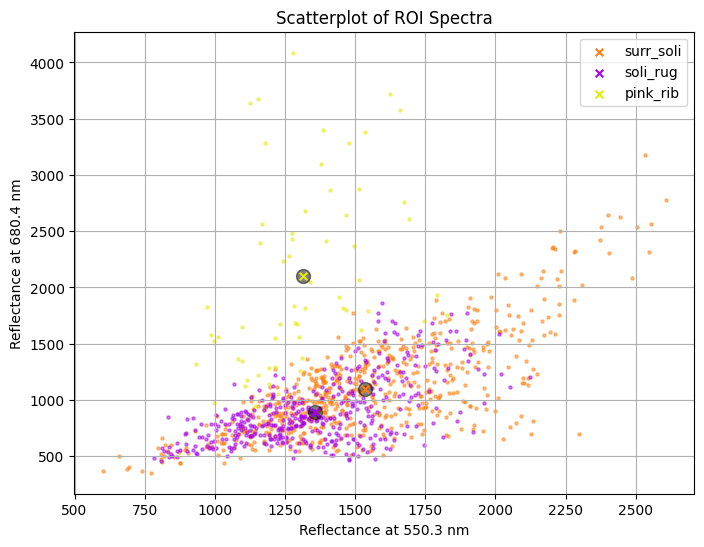

In [96]:
# Create a scatterplot of the data
i1 = np.argmin(np.abs(wl_im-550))
i2 =  np.argmin(np.abs(wl_im-680))

# sort by number of pixels in each ROI
pixCount = []
for name in roi_names:
    pixCount.append(np.sum(roi_masks[name]))
pixCount = np.asarray(pixCount)
idx_order = np.argsort(-pixCount)

plt.figure(figsize=(8,6))

# plot all of the spectra for this class
for i in idx_order:
    # get the ROI name
    name = roi_names[i]
    # get the indices for the spectra for this class
    class_spectra = spectra[spectra_names==name,:]    
    # scatterplot the class spectra at this band
    plt.scatter(class_spectra[:,i1], class_spectra[:,i2], s=5, color=roi_colors[name], alpha=0.5);
    
    
# plot the class mean spectrum for this class
for i in idx_order:
    # get the ROI name
    name = roi_names[i]
    # scatterplot the class mean spectrum at this band
    plt.scatter(means[name][i1], means[name][i2], s=100, color='k', alpha=0.5);
    plt.scatter(means[name][i1], means[name][i2], marker='x', s=30, label=name, color=roi_colors[name]);
    
plt.grid(True)
plt.legend()
plt.xlabel(f'Reflectance at {wl_im[i1]:.1f} nm')
plt.ylabel(f'Reflectance at {wl_im[i2]:.1f} nm')
plt.title('Scatterplot of ROI Spectra');

## Step Six: Load spectral library

In [24]:
df = pd.read_pickle('/Volumes/UPWINS_gia/library/library.pkl')
sc = util.SpectralCollection(df)
wl_lib = sc.wl
names = sc.name
spectra = sc.spectra
X_o = sc.spectra
Yn_o = sc.name
Yg_o = sc.genus
Ys_o = sc.species
Ypp_o = sc.principle_part
Yh_o = sc.health
Ya_o = sc.age
Yl_o = sc.lifecycle
Yd_o = sc.DateTimeId
Ym_o = sc.month
Yngs_o = sc.name_genus_species
Ynfc_o = sc.name_full_category
Ypt_o = sc.plant_type
print(X_o.shape,Yn_o.shape)

(4086, 2151) (4086,)


In [25]:
tnames_short = []
spectra_soli  = []
tgt_names = []
tgt_indices = []

for n in tgt_names:
    tnames_short.append(n.replace("Solidago", "soli").replace("rugosa", "r").replace("Rugosa", "r"))

for i in range(len(names)):
    if names[i][:10]=='Solidago_r':
        tgt_indices.append(i)
        tgt_names.append(names[i])

for idx, i in enumerate(tgt_indices):
    spectra_soli.append(spectra[i, :])

spectra_soli = np.array(spectra_soli)
spectra_soli[spectra_soli < 0] = 0  # Set negative values to zero

/var/folders/qv/tryzsm_d3zz_hfcy7m6pp6_m0000gn/T/ipykernel_29895/572575907.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc=(1.04, 0), fontsize=6)


Text(0.5, 1.0, 'Spectra for the Target Species (Soli.r)')

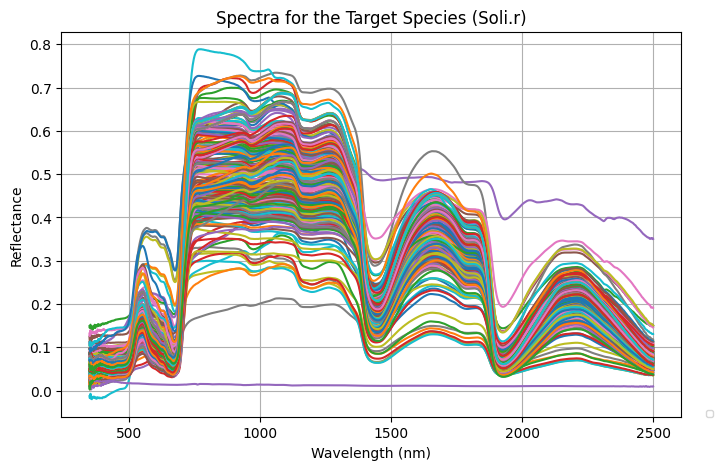

In [26]:
# Ensure tgt_indices only contains indices within the bounds of spectra_ammo
plt.figure(figsize=(8, 5))

# Loop through valid indices for Ammo species (make sure they are within the size of spectra_ammo)
for i in tgt_indices:
    #if i < spectra_soli.shape[i]:  # Ensure the index is within bounds
    plt.plot(wl_lib, spectra[i, :])

plt.legend(loc=(1.04, 0), fontsize=6)
plt.grid(True)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.title('Spectra for the Target Species (Soli.r)')

## Step Seven: Resample the spectral library

In [27]:
# Create a BandResampler, which is a function that resamples spectra from one source to match a different source.
# See: https://www.spectralpython.net/class_func_ref.html?highlight=resampling#spectral.algorithms.resampling.BandResampler
# Inputs: the first input is the wavelengths for the spectra that you are going to resample, the second input is the wavelevngths that you want to resample to.
resampler = spectral.BandResampler(wl_lib, wl_im)
spectra_resampled_soli = resampler(spectra_soli.T).T

print(f'The shape of the spectral library is {spectra_resampled_soli.shape}.')
print(f'({spectra_resampled_soli.shape[0]} spectra with {spectra_resampled_soli.shape[1]} bands.)')

The shape of the spectral library is (253, 343).
(253 spectra with 343 bands.)


In [28]:
resampler = spectral.BandResampler(wl_lib, wl_im)
spectra_resampled_lib = resampler(spectra.T).T

print(f'The shape of the spectral library is {spectra_resampled_lib.shape}.')
print(f'({spectra_resampled_lib.shape[0]} spectra with {spectra_resampled_lib.shape[1]} bands.)')

The shape of the spectral library is (4086, 343).
(4086 spectra with 343 bands.)


In [29]:
import numpy as np

# Find the indices in 'spectra_resampled_lib' where the rows match exactly with rows in 'spectra_resampled_soli'
matching_indices = []

for i, row_soli in enumerate(spectra_resampled_soli):
    # Check if the row from 'spectra_resampled_soli' exists in 'spectra_resampled_lib'
    match_idx = np.where(np.all(spectra_resampled_lib == row_soli, axis=1))[0]
    if match_idx.size > 0:  # If a match is found
        matching_indices.append((i, match_idx))

# Display the matching indices (i from 'spectra_resampled_soli' and the corresponding indices in 'spectra_resampled_lib')
print("Matching indices in 'spectra_resampled_lib' for each row in 'spectra_resampled_soli':")
for soli_idx, lib_idx in matching_indices:
    print(f"Row {soli_idx} in spectra_resampled_soli matches row(s) {lib_idx} in spectra_resampled_lib")


Matching indices in 'spectra_resampled_lib' for each row in 'spectra_resampled_soli':
Row 0 in spectra_resampled_soli matches row(s) [1627] in spectra_resampled_lib
Row 1 in spectra_resampled_soli matches row(s) [1628] in spectra_resampled_lib
Row 2 in spectra_resampled_soli matches row(s) [1629] in spectra_resampled_lib
Row 3 in spectra_resampled_soli matches row(s) [1630] in spectra_resampled_lib
Row 4 in spectra_resampled_soli matches row(s) [1631] in spectra_resampled_lib
Row 5 in spectra_resampled_soli matches row(s) [1632] in spectra_resampled_lib
Row 6 in spectra_resampled_soli matches row(s) [1633] in spectra_resampled_lib
Row 7 in spectra_resampled_soli matches row(s) [1634] in spectra_resampled_lib
Row 8 in spectra_resampled_soli matches row(s) [1635] in spectra_resampled_lib
Row 10 in spectra_resampled_soli matches row(s) [1637] in spectra_resampled_lib
Row 11 in spectra_resampled_soli matches row(s) [1638] in spectra_resampled_lib
Row 12 in spectra_resampled_soli matches ro

In [30]:
# Uncomment to check for difference in 
imArr_adj = (imArr/10000)

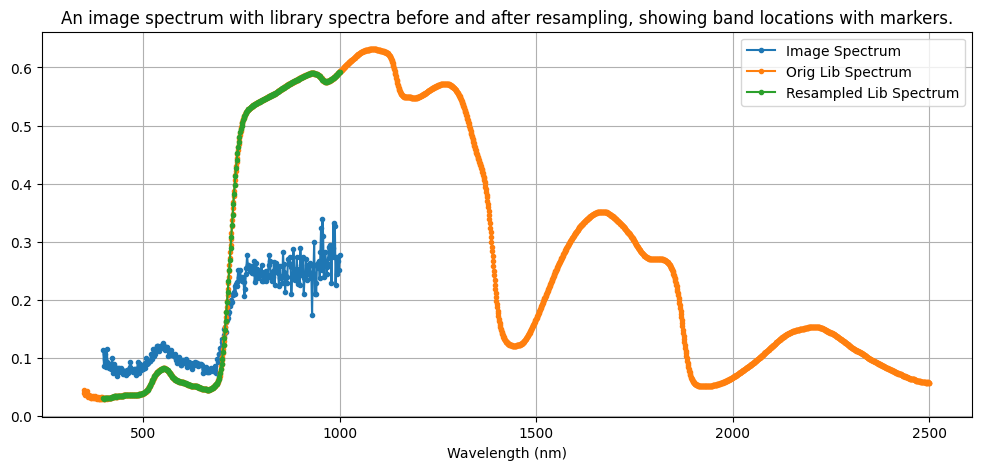

In [32]:
plt.figure(figsize=(12,5))
plt.title('An image spectrum with library spectra before and after resampling, showing band locations with markers.')

plt.plot(wl_im, imArr_adj[312,108,:].flatten(), marker='.', label='Image Spectrum')
plt.plot(wl_lib, spectra[3921,:], marker='.', label='Orig Lib Spectrum')
plt.plot(wl_im, spectra_resampled_lib[3921,:].flatten(), marker='.', label='Resampled Lib Spectrum')
plt.xlabel('Wavelength (nm)')
plt.grid()
plt.legend();

In [43]:
spectra_resampled_soli

array([[0.0434919 , 0.04361286, 0.04366493, ..., 0.45481508, 0.45506013,
        0.45512571],
       [0.0380988 , 0.03802908, 0.03826333, ..., 0.43772503, 0.43795055,
        0.43814359],
       [0.03368171, 0.03282773, 0.03424068, ..., 0.41563938, 0.4160389 ,
        0.41634799],
       ...,
       [0.0637577 , 0.06283564, 0.06242463, ..., 0.48257975, 0.4830253 ,
        0.48362706],
       [0.06707776, 0.06662793, 0.06543963, ..., 0.47756787, 0.47812771,
        0.47855266],
       [0.06063585, 0.06003426, 0.06021489, ..., 0.44159468, 0.44207931,
        0.44271616]])

In [44]:
im

	Data Source:   '/Volumes/UPWINS_gia/Ortho_Rec/raw_5000_or_quac'
	# Rows:           1324
	# Samples:        1206
	# Bands:           343
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16

## Step Eight: Perform model and classification algorithms

In [54]:
# Helper functions
import seaborn as sns
import scipy
def add_white(im, tgt_spectra):
    im.t = tgt_spectra
    
    # Compute the mean and covariance
    im.mu = np.mean(im.dataList, axis=0)
    #im.mu = np.reshape(imageMean, (len(imageMean),1))
    im.C = np.cov(im.dataList.T)
    
    # Compute the eigenvectors, eigenvalues, and whitening matrix
    evals,evecs = np.linalg.eig(im.C)
    # truncate the small eigenvalues to stablize the inverse
    evals[evals<10**(-8)] = 10**(-8)
    DiagMatrix = np.diag(evals**(-1/2))
    im.W = np.matmul(evecs,DiagMatrix)
    
    # Whiten the image
    im_demean = im.List-im.mu
    im.ListW = np.matmul(im.W.T,im_demean.T).T 
    
    # Whiten the target
    im.tW = np.matmul(im.W.T,(im.t-im.mu).T).T
    
    return im

def ace_det(im):            
    nr = im.nrows # number of rows in the image
    nc = im.ncols # number of columns in the image
    nt = im.tW.shape[0] # number of target spectra
    # numerator is dot product of each pixel and the target (whitened)
    numerator = np.matmul(im.ListW,im.tW.T) #XT
    # denomenator is norm of each pixel times the norm of the target (whitened)
    Xnorm = np.reshape(np.sqrt(np.sum(im.ListW**2, axis=1)), (nr*nc,1))
    Tnorm = np.reshape(np.sqrt(np.sum(im.tW**2, axis=1)), (nt,1))
    denom = np.matmul( Xnorm, Tnorm.T) #sqrt(XX)*sqrt(TT)
    # take the ratio and reshape
    D = numerator / denom # XT/(sqrt(XX)*sqrt(TT))
    D = np.reshape(D, (nr, nc, nt))
    return D  

def mf_det(im):
    nr = im.nrows # number of rows in the image
    nc = im.ncols # number of columns in the image
    nt = im.tW.shape[0] # number of target spectra
    # numerator is dot product of each pixel and the target (whitened)
    numerator = np.matmul(im.ListW,im.tW.T) #XT
    # denomenator is the norm of the target squared (whitened)
    denom = np.reshape(np.sum(im.ListW**2, axis=1), (nr*nc,1)) #XX
    # take the ratio and reshape
    D = numerator / denom #XT/XX
    D = np.reshape(D, (nr, nc, nt))
    return D 


def plot_hist(det, roiData, mask_name, nbins=50, detectorName='ACE'):
    
    # calculate the masks
    states = np.squeeze(roiData.masks[mask_name]).astype(int)

    # calculate output probabilities    
    target_det = det[states==1]
    target_mean = np.mean(target_det)
    target_std = np.std(target_det)

    N_det = det[states==0]
    N_mean = np.mean(N_det)
    N_std = np.std(N_det)

    print(f'Target: mean={target_mean}, std={target_std}')
    print(f'None: mean={N_mean}, std={N_std}')

    # plot output pdfs

    # plot historgrams of the output
    plt.figure(figsize=(12,4))
    plt.subplot(1, 3, 1) # layout to make 1 row, 2 columns of plots, and create to location 1.
    ax1 = sns.histplot(data=N_det, stat="probability", bins=nbins, kde=True, label=f'{detectorName} None');
    ax1 = sns.histplot(data=target_det, stat="probability", bins=nbins, kde=True, label=f'{detectorName} Solidago');
    ax1.set(xlabel='x ', ylabel='Frequency', title='Observation Histograms')
    ax1.legend();

    # plot the probability density functions
    ax2 = plt.subplot(1, 3, 2) # layout to make 1 row, 2 columns of plots, and create to location 2.
    x = np.linspace(ax1.get_xlim()[0], ax1.get_xlim()[1], 100) # generate a list of x-values
    yn = scipy.stats.norm.pdf(x, loc=N_mean, scale=N_std) # compute the PDF at these x-values
    ax2.plot(x,yn, label='Obs None')
    yBacc = scipy.stats.norm.pdf(x, loc=target_mean, scale=target_std) # compute the PDF at these x-values
    ax2.plot(x,yBacc, label='Obs Target')
    ax2.legend()
    ax2.set(xlabel='x ', ylabel='PDF', 
        title=f'Observation PDFs');

    # plot the cumulative density functions
    ax3 = plt.subplot(1, 3, 3) # layout to make 1 row, 2 columns of plots, and create to location 2.
    ax3.plot(x,yBacc/(yBacc+yn), label='Obs Target')
    ax3.legend()
    ax3.set(xlabel='x ', ylabel='CDF', 
        title=f'Detection CDF');
    plt.tight_layout()


In [45]:
im.Arr = imArr

In [46]:
im = add_white(im, spectra_resampled_soli)
ace = ace_det(im)
ace_max_val = np.max(ace, axis=2)*mask
mf = mf_det(im)
mf_max_val = np.max(mf, axis=2)*mask

Target: mean=-0.0009912564071430144, std=0.05329891677600773
None: mean=0.003001572222285496, std=0.048315484406372164


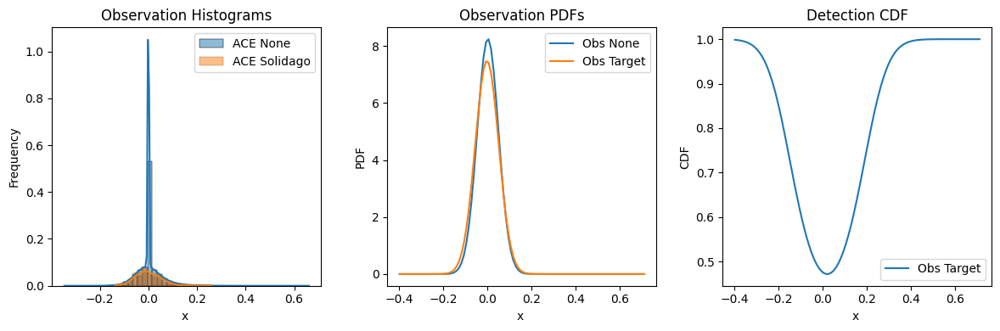

In [55]:
plot_hist(ace_max_val, roiData, mask_name='soli_rug', detectorName='ACE')

Target: mean=0.004661833575925579, std=0.024406970946926048
None: mean=0.0026531245799078424, std=0.026270621244696136


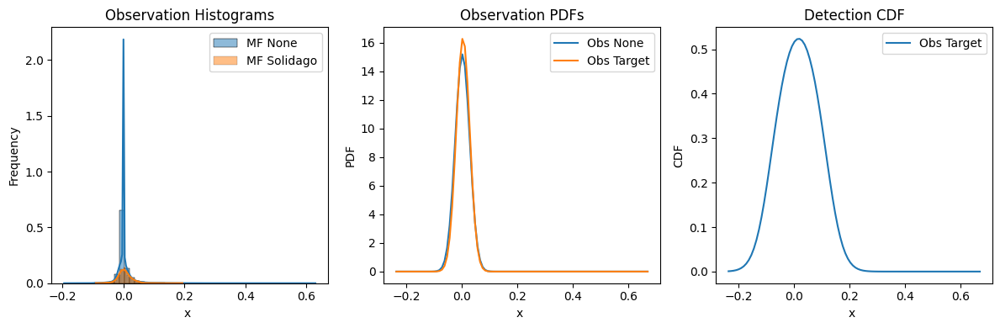

In [63]:
plot_hist(mf_max_val, roiData, mask_name='surr_soli', detectorName='MF')

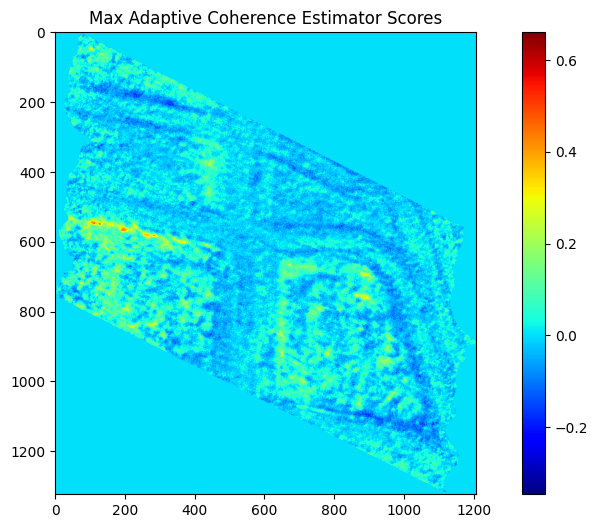

In [57]:
plt.figure(figsize=(12,6))
plt.imshow(ace_max_val, cmap='jet')
plt.title("Max Adaptive Coherence Estimator Scores")
plt.colorbar()
plt.show()

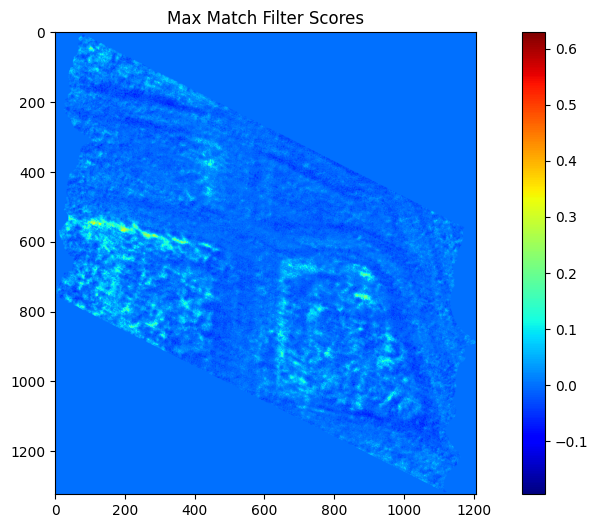

In [58]:
plt.figure(figsize=(12,6))
plt.imshow(mf_max_val, cmap='jet')
plt.title("Max Match Filter Scores")
plt.colorbar()
plt.show()

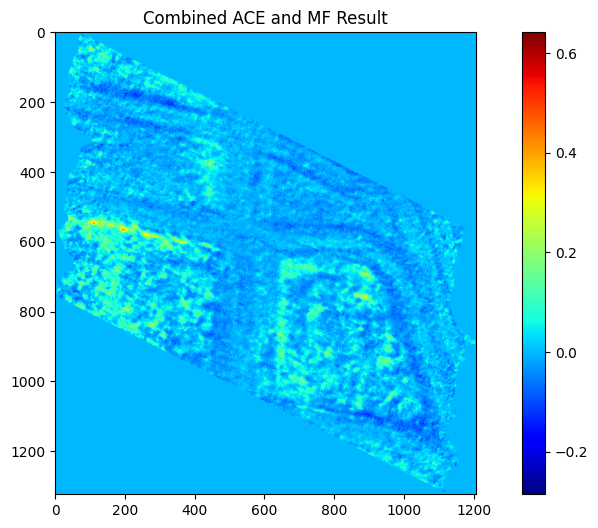

In [59]:
# Assuming you have weight parameters for ACE and MF
weight_ace = 0.6
weight_mf = 0.4

# Combine ACE and MF max values using a weighted sum
combined_result = (weight_ace * ace_max_val) + (weight_mf * mf_max_val)

# Plot the combined result
plt.figure(figsize=(12, 6))
plt.imshow(combined_result, cmap='jet')
plt.title("Combined ACE and MF Result")
plt.colorbar()
plt.show()

In [61]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Assuming your image data (features) is in `im.List` and the target labels are in `roiData.masks['Baccharis Halimifolia']`
# Flattening the image features (if necessary, based on your data structure)
X_train = im.List  # Flattened image data (ensure this is the correct format)
y_train = roiData.masks['soli_rug'].flatten().astype(int)  # Binary labels (1 for target, 0 for background)

# Fit LDA model
lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train, y_train)  # Fit on the features and corresponding labels

# After fitting, use QDA to predict probabilities for the target class
lda_scores = lda_model.predict_proba(X_train)[:, 1]  # Get probability of target class (Baccharis Halimifolia)

# Combine detection scores (ACE, MF, QDA)
ace_flattened = ace_max_val.flatten()  # Flatten ACE scores
mf_flattened = mf_max_val.flatten()    # Flatten MF scores


In [64]:
# Combine the detection scores (element-wise averaging)
combined_scores_flattened_lda = (ace_flattened + mf_flattened + lda_scores) / 3

# Reshape combined scores back to the spatial dimensions of the image (300, 600)
combined_scores_lda = combined_scores_flattened_lda.reshape(im.nrows, im.ncols)


In [65]:
lda_scores_n = lda_scores.reshape(im.nrows, im.ncols)

Target: mean=0.277905136346817, std=0.4327237904071808
None: mean=0.0007205570582300425, std=0.024263571947813034


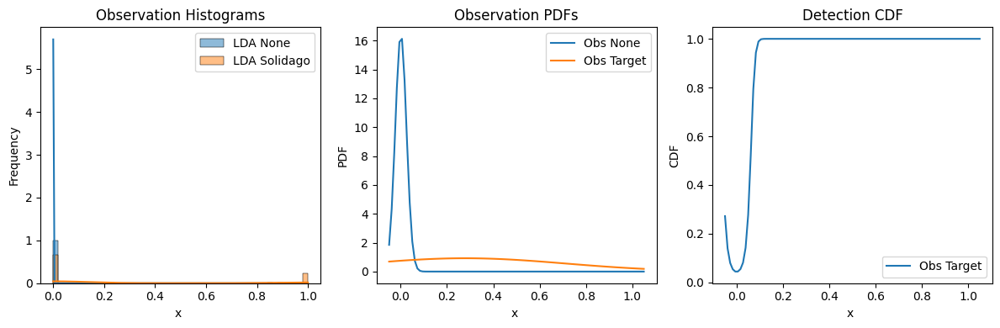

In [67]:
plot_hist(lda_scores_n, roiData, mask_name='soli_rug', detectorName='LDA')

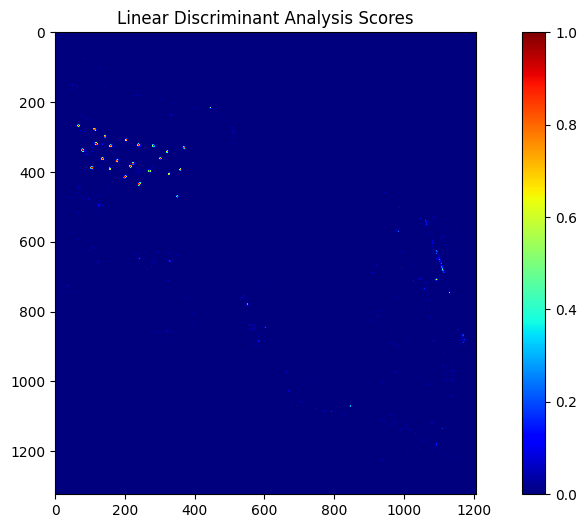

In [68]:
plt.figure(figsize=(12,6))
plt.imshow(lda_scores_n, cmap='jet')
plt.title("Linear Discriminant Analysis Scores")
plt.colorbar()
plt.show()

Target: mean=0.25905146552952363, std=0.2060705015456668
None: mean=0.0834398296888894, std=0.13555141627985515


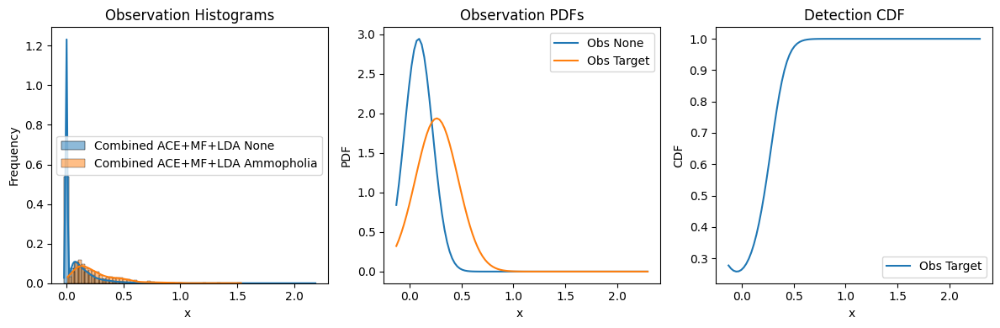

In [106]:
plot_hist(combined_scores_lda, roiData, detectorName='Combined ACE+MF+LDA')

In [1]:
plt.figure(figsize=(12,6))
plt.imshow(combined_scores_lda, cmap='jet')
plt.title("Linear Discriminant Analysis Scores")
plt.colorbar()
plt.show()

NameError: name 'plt' is not defined

## Step Nine: Visualize Results

In [123]:
combined_scores_lda_flat = combined_scores_lda.flatten()

In [119]:
y_true.shape

(1881708,)

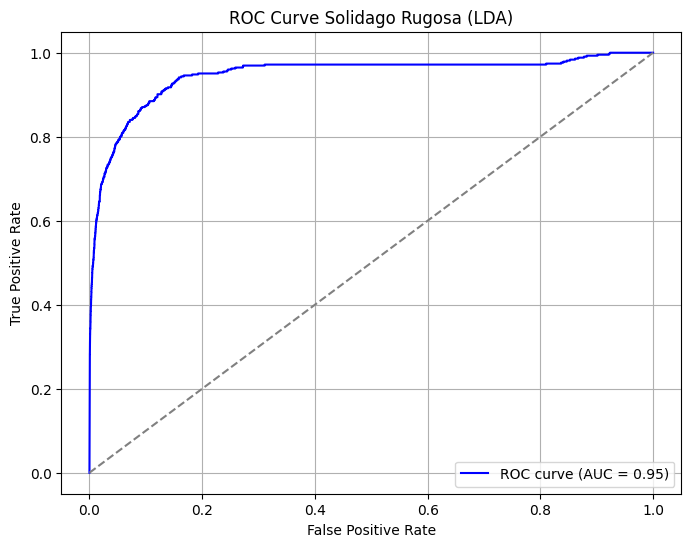

In [71]:
y_true = roiData.masks['soli_rug'].flatten().astype(int)  

fpr, tpr, thresholds = roc_curve(y_true, lda_scores)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Solidago Rugosa (LDA)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

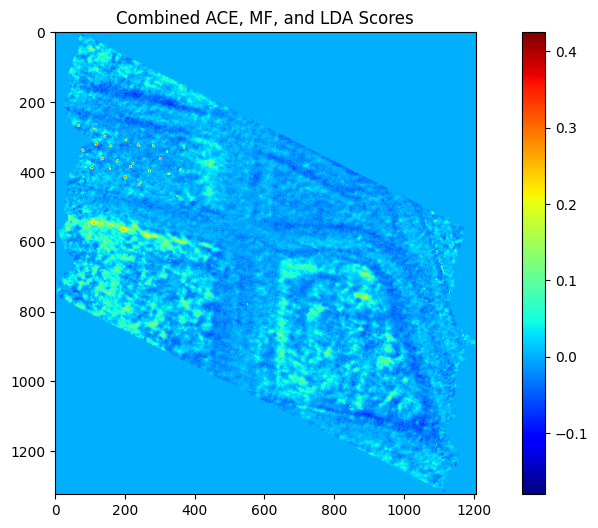

In [120]:
plt.figure(figsize=(12,6))
plt.imshow(combined_scores_lda, cmap='jet')
plt.title("Combined ACE, MF, and LDA Scores")
plt.colorbar()
plt.show()

## Viewing PCA-transformed scatterplots of the ROI spectra

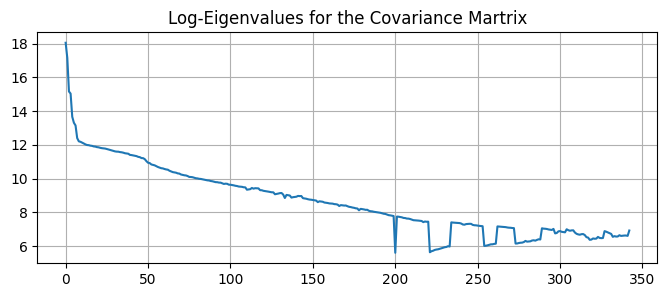

In [97]:
# compute mean and covariance of the spectra
mu = np.mean(spectra, axis=0)
C = np.cov(spectra.T)

# Compute the eigenvectors, eigenvalues, and whitening matrix
evals,evecs = np.linalg.eig(C)
# Plot the eigenvalues to examine stability 
# (Only the first N-1 of these will be meaningful, where N = # classes)
plt.figure(figsize=(8,3))
plt.plot(np.log(evals))
plt.grid(True)
plt.title('Log-Eigenvalues for the Covariance Martrix')
# truncate the small eigenvalues to stablize the inverse
tol = 10**(-8)
evals[evals<tol] = tol
DiagMatrix = np.diag(evals**(-1/2))
W = np.matmul(evecs,DiagMatrix)

# whiten the spectra
Wspectra = np.matmul(W.T, (spectra-mu).T).T

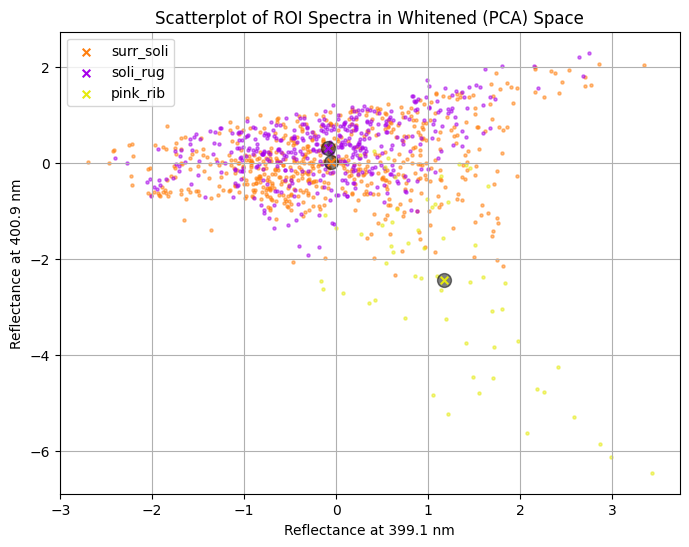

In [99]:
# Create a scatterplot of the data
i1 = 0
i2 = 1

# sort by number of pixels in each ROI
pixCount = []
for name in roi_names:
    pixCount.append(np.sum(roi_masks[name]))
pixCount = np.asarray(pixCount)
idx_order = np.argsort(-pixCount)

plt.figure(figsize=(8,6))

Wmeans = {}
# plot all of the spectra for this class
for i in idx_order:
    # get the ROI name
    name = roi_names[i]
    # get the indices for the spectra for this class
    class_spectra = Wspectra[spectra_names==name,:]   
    Wmeans[name] = np.mean(class_spectra, axis=0)
    # scatterplot the class spectra at this band
    plt.scatter(class_spectra[:,i1], class_spectra[:,i2], s=5, color=roi_colors[name], alpha=0.5);
    
    
# plot the class mean spectrum for this class
for i in idx_order:
    # get the ROI name
    name = roi_names[i]
    # scatterplot the class mean spectrum at this band
    plt.scatter(Wmeans[name][i1], Wmeans[name][i2], s=100, color='k', alpha=0.5);
    plt.scatter(Wmeans[name][i1], Wmeans[name][i2], marker='x', s=30, label=name, color=roi_colors[name]);
    
plt.grid(True)
plt.legend()
plt.xlabel(f'Reflectance at {wl_im[i1]:.1f} nm')
plt.ylabel(f'Reflectance at {wl_im[i2]:.1f} nm')
plt.title('Scatterplot of ROI Spectra in Whitened (PCA) Space');

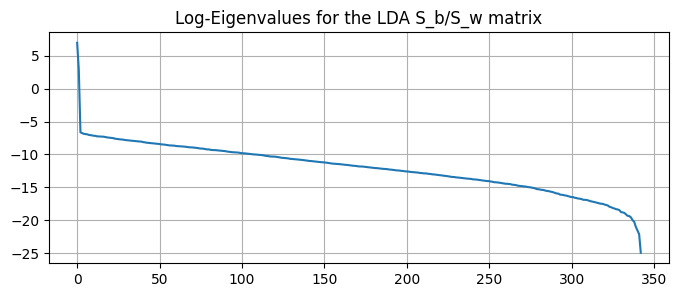

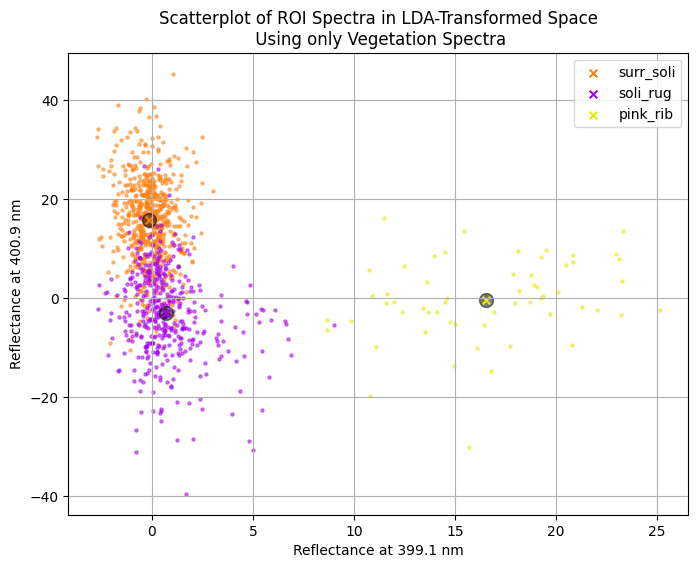

In [112]:
roi_names_veg = ['surr_soli', 'soli_rug', 'pink_rib']

# ----- Compute the LDA Transform -----

# Compute the covaraince (often called the within-class-scatter in LDA, denoted S_W)
nClasses = len(roi_names_veg)
nb = spectra.shape[1]
C = np.zeros((nb,nb)) # covariance (Sigma in the Wikipedia page)
for name in roi_names_veg:
    # get the spectra for this class
    class_spectra = spectra[spectra_names==name,:]    
    # compute the covariance for this class
    C_class = np.cov(class_spectra.T)
    # compute the number of spectra in this class
    nSpec_class = class_spectra.shape[0]
    # add the covariance of this class,
    # weighted by the fraction of total pixels that come from this class
    nSpec = spectra.shape[0]
    C = C + (nSpec_class/nSpec)*C_class 

# Computing the coavariance of the means (often called the between-class scatter in LDA, denoted S_b)
Cb = np.zeros((nb,nb))
for name in roi_names_veg:
    mu_diff = np.reshape((means[name] - mu), (nb,1))
    Cb = Cb + (1/nClasses)*np.matmul(mu_diff, mu_diff.T)

# Compute evals and evecs of S_W^(-1) S_B, and then the LDA-Transform matrix
evecs, evals, Vt = np.linalg.svd(np.linalg.pinv(C).dot(Cb))
# Plot the eigenvalues to examine stability 
# (Only the first N-1 of these will be meaningful, where N = # classes)
plt.figure(figsize=(8,3))
plt.plot(np.log(evals))
plt.grid(True)
plt.title('Log-Eigenvalues for the LDA S_b/S_w matrix')
# truncate the small eigenvalues to stablize the inverse
tol = 10**(-8)
evals[evals<tol] = tol
DiagMatrix = np.diag(evals**(-1/2))
W_lda = np.matmul(evecs,DiagMatrix)

# LDA-transform the spectra
LDA_spectra = np.matmul(W_lda.T, (spectra).T).T



# ----- Plot the Transformed Data -----
# Create a scatterplot of the data
i1 = 0
i2 = 1
# sort by number of pixels in each ROI
pixCount = []
for name in roi_names_veg:
    pixCount.append(np.sum(roi_masks[name]))
pixCount = np.asarray(pixCount)
idx_order = np.argsort(-pixCount)
# Create the scatterplot of the LDA-transformed data
plt.figure(figsize=(8,6))
LDA_means = {}
# plot all of the spectra for this class
for i in idx_order:
    # get the ROI name
    name = roi_names_veg[i]
    # get the indices for the spectra for this class
    class_spectra = LDA_spectra[spectra_names==name,:]   
    LDA_means[name] = np.mean(class_spectra, axis=0)
    # scatterplot the class spectra at this band
    plt.scatter(class_spectra[:,i1], class_spectra[:,i2], s=5, color=roi_colors[name], alpha=0.5);
# plot the class mean spectrum for this class
for i in idx_order:
    # get the ROI name
    name = roi_names_veg[i]
    # scatterplot the class mean spectrum at this band
    plt.scatter(LDA_means[name][i1], LDA_means[name][i2], s=100, color='k', alpha=0.5);
    plt.scatter(LDA_means[name][i1], LDA_means[name][i2], marker='x', s=30, label=name, color=roi_colors[name]);
plt.grid(True)
plt.legend()
plt.xlabel(f'Reflectance at {wl_im[i1]:.1f} nm')
plt.ylabel(f'Reflectance at {wl_im[i2]:.1f} nm')
plt.title('Scatterplot of ROI Spectra in LDA-Transformed Space\n Using only Vegetation Spectra');

In [115]:
nClasses = len(roi_names)
nb = spectra.shape[1]
C = np.zeros((nb,nb)) # covariance (Sigma in the Wikipedia page)
for name in roi_names:
    # get the spectra for this class
    class_spectra = spectra[spectra_names==name,:]    
    # compute the covariance for this class
    C_class = np.cov(class_spectra.T)
    # compute the number of spectra in this class
    nSpec_class = class_spectra.shape[0]
    # add the covariance of this class,
    # weighted by the fraction of total pixels that come from this class
    C = C + (nSpec_class/nSpec)*C_class 

# compute the whitening matrix
evals,evecs = np.linalg.eig(C)
tol = 10**(-6)
evals[evals<tol] = tol
DiagMatrix = np.diag(evals**(-1/2))
roi_Ws[name] = np.matmul(evecs,DiagMatrix)
DiagMatrix = np.diag(evals**(-1/2))
W_all = np.matmul(evecs,DiagMatrix)
    
# Create array to hold the Mahalanobis Distance
MD = np.zeros((nSpec, nClasses))

# compute the mean and covariance for each class
roi_means = {}
roi_Ws = []
for name in roi_names:
    plt.figure(figsize=(10,5))
    # get the spectra for this class
    class_spectra = spectra[spectra_names==name,:] 
    # compute the covariance for this class
    mu = np.mean(class_spectra, axis=0)
    C = np.cov(class_spectra.T)
    # Compute the eigenvectors, eigenvalues, and whitening matrix
    evals,evecs = np.linalg.eig(C)
    # truncate the small eigenvalues to stablize the inverse
    tol = 10**(-8)
    evals[evals<tol] = tol
    DiagMatrix = np.diag(evals**(-1/2))


    roi_Ws[name] = np.matmul(evecs,DiagMatrix)
    #roi_Ws.update({roi_Ws[name]: np.matmul(evecs, DiagMatrix)})



    DiagMatrix = np.diag(evals**(-1/2))
    W_this_class = np.matmul(evecs,DiagMatrix)
    
    if np.sum(spectra_names==name) < 100:
        W = W_all
    else:
        W = W_this_class        
    
    MD_class = np.sqrt(np.sum((np.matmul(W.T, (im.List-mu).T).T)**2, axis=1))
    MD_class[MD_class>100] = 100
    MD_class = MD_class/np.mean(MD_class)
    MD_class = np.real(MD_class)
    #MD_class = MD_class - np.min(MD_class)
    MD_class_im = np.reshape(MD_class, (nr,nc))
    plt.imshow(np.exp(-MD_class_im))
    plt.xticks([])
    plt.yticks([])
    plt.title(f'Probability Image for {name}')
    plt.colorbar()

NameError: name 'roi_Ws' is not defined

## Step Ten: Document findings in a report and store it in the SDS folder on SharePoint

Please share your results here!: https://myuva.sharepoint.com/:f:/r/sites/UPWINS_FY22_EWN/Shared%20Documents/07_Presentations/Presentations_Progress%20Development_Diagrams/SDS?csf=1&web=1&e=3iGOSf